# Artificial Neural Networks and Deep Learning

---

## Homework 1


### ⏳ Load the Data

In [1]:
import numpy as np

data = np.load('training_set.npz')
X = data['images']
y = data['labels'] # Load the training data here
print(y.shape)

(13759, 1)


In [2]:
# elimina i duplicati
X, indices = np.unique(X, return_index=True, axis=0)
y = y[indices]
print(X.shape)
print(y.shape)

(11953, 96, 96, 3)
(11953, 1)


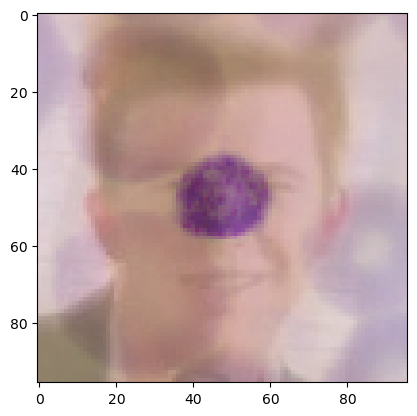

In [3]:
import matplotlib.pyplot as plt

plt.imshow(X[1008])

In [4]:
# intruso_idx è l'indice dell'immagine da eliminare
intruso_idx = 1008

# Elimina l'immagine dall'array X
X = np.delete(X, intruso_idx, axis=0)

# Elimina anche la corrispondente etichetta dall'array y
y = np.delete(y, intruso_idx, axis=0)

print(f"Nuova shape di X: {X.shape}")
print(f"Nuova shape di y: {y.shape}")

Nuova shape di X: (11952, 96, 96, 3)
Nuova shape di y: (11952, 1)


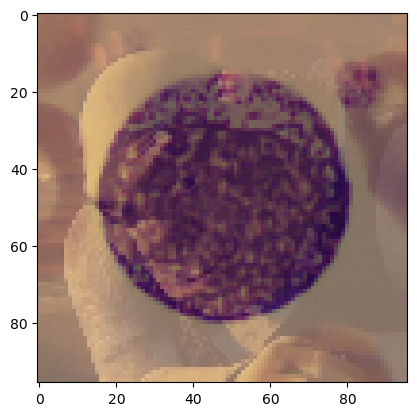

In [5]:
plt.imshow(X[58])

In [6]:
# intruso_idx è l'indice dell'immagine da eliminare
intruso_idx = 58

# Elimina l'immagine dall'array X
X = np.delete(X, intruso_idx, axis=0)

# Elimina anche la corrispondente etichetta dall'array y
y = np.delete(y, intruso_idx, axis=0)

print(f"Nuova shape di X: {X.shape}")
print(f"Nuova shape di y: {y.shape}")

Nuova shape di X: (11951, 96, 96, 3)
Nuova shape di y: (11951, 1)


In [7]:
!pip install -r requirements.txt

### Data similarity analysis

Trovate 2444231 coppie di immagini simili con somiglianza > 0.8


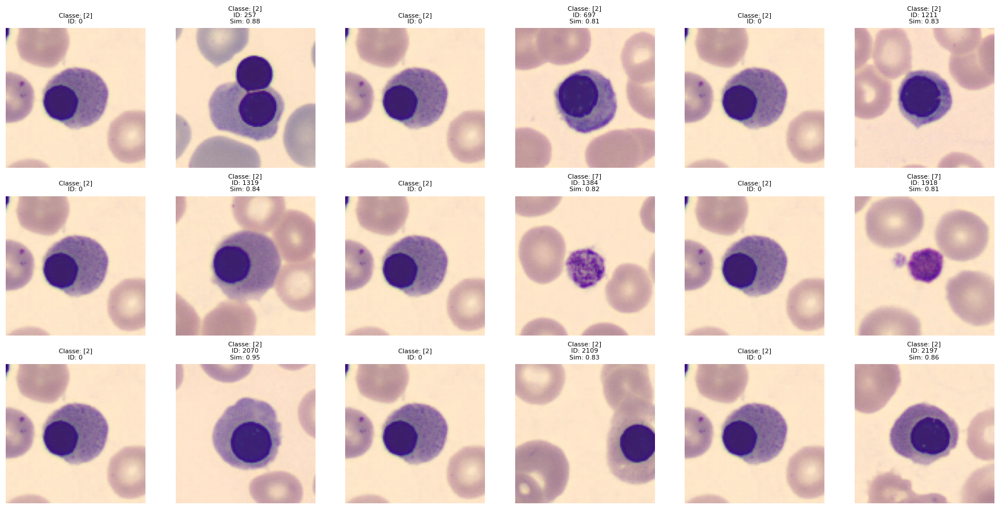

In [9]:
import numpy as np
import tensorflow as tf
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt

# 1. Estrai le feature delle immagini utilizzando un modello pre-addestrato
def extract_features(model, images):
    """
    Estrai le feature utilizzando un modello pre-addestrato.
    """
    images = tf.keras.applications.efficientnet.preprocess_input(images)
    features = model.predict(images, verbose=0)
    return features

# Carica un modello pre-addestrato per estrarre le feature
base_model = tf.keras.applications.EfficientNetB0(
    include_top=False, weights='imagenet', input_shape=(96, 96, 3), pooling='avg'
)

# 2. Estrazione delle feature dal dataset
features = extract_features(base_model, X)  # X è il tuo dataset di immagini (shape: (N, 96, 96, 3))

# 3. Calcolo della somiglianza
similarity_matrix = cosine_similarity(features)  # Matrice di somiglianza (NxN)

# 4. Trova immagini simili
threshold = 0.8  # Soglia di somiglianza
pairs = []

for i in range(len(similarity_matrix)):
    for j in range(i + 1, len(similarity_matrix)):
        if similarity_matrix[i, j] > threshold:
            pairs.append((i, j, similarity_matrix[i, j]))

# 5. Visualizza alcune immagini simili
print(f"Trovate {len(pairs)} coppie di immagini simili con somiglianza > {threshold}")

# Numero di coppie da mostrare
num_pairs_to_show = 9
rows = (num_pairs_to_show + 2) // 3  # 3 coppie per riga
fig, axes = plt.subplots(rows, 6, figsize=(18, rows * 3))  # 6 colonne: 3 coppie per riga

for idx, (img1_idx, img2_idx, sim) in enumerate(pairs[:num_pairs_to_show]):
    row, col_start = divmod(idx * 2, 6)
    
    # Mostra immagine 1
    axes[row, col_start].imshow(X[img1_idx].astype("uint8"))
    axes[row, col_start].set_title(f"Classe: {y[img1_idx]}\nID: {img1_idx}", fontsize=8)
    axes[row, col_start].axis('off')

    # Mostra immagine 2
    axes[row, col_start + 1].imshow(X[img2_idx].astype("uint8"))
    axes[row, col_start + 1].set_title(f"Classe: {y[img2_idx]}\nID: {img2_idx}\nSim: {sim:.2f}", fontsize=8)
    axes[row, col_start + 1].axis('off')

# Rimuovi gli assi vuoti
for ax in axes.flatten():
    if not ax.has_data():
        ax.axis('off')

plt.tight_layout()
plt.show()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
Trovate 2444231 coppie di immagini simili con somiglianza > 0.8


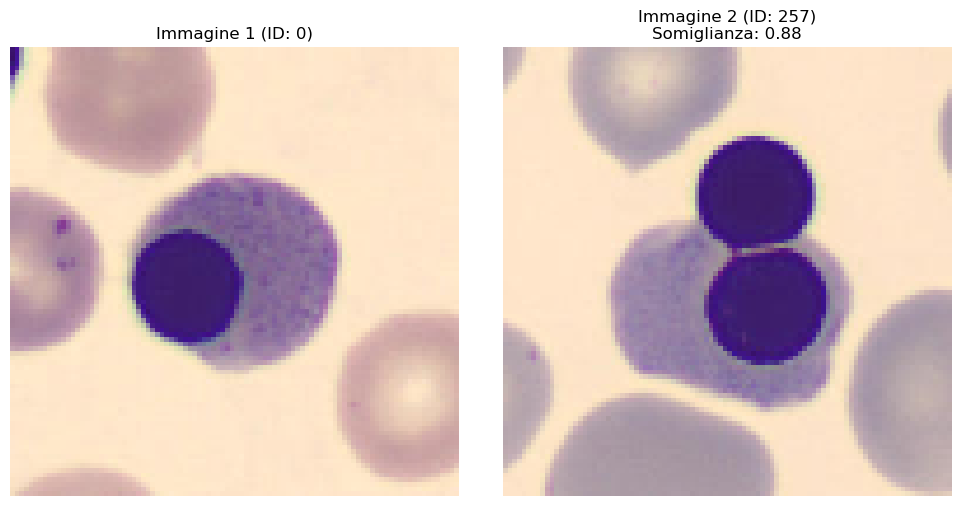

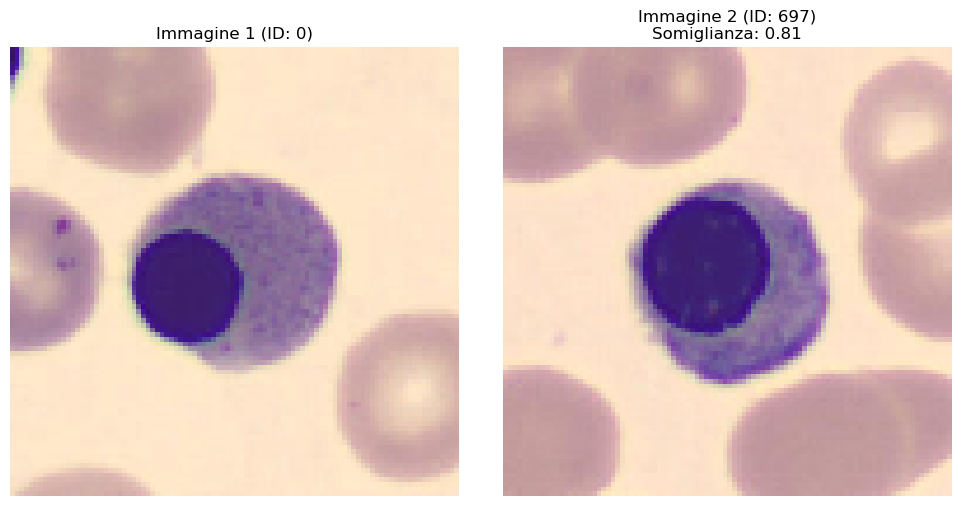

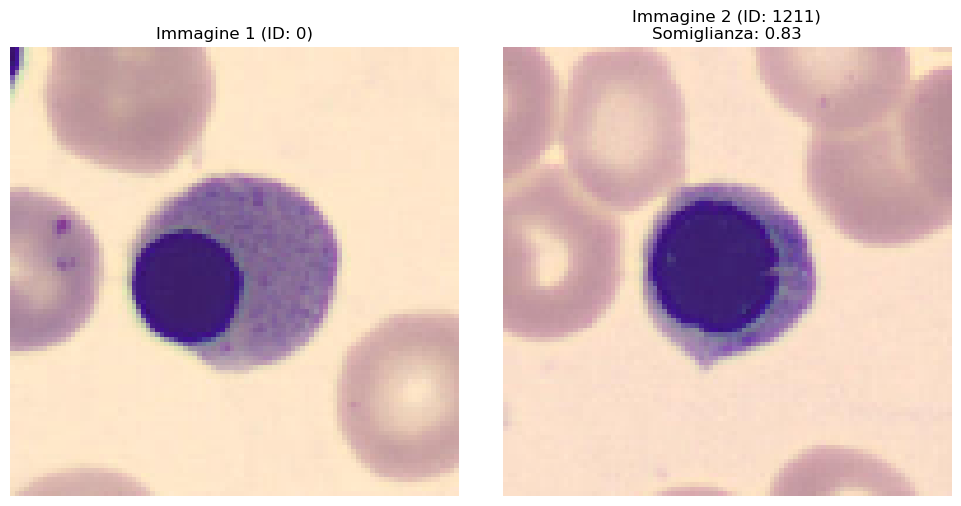

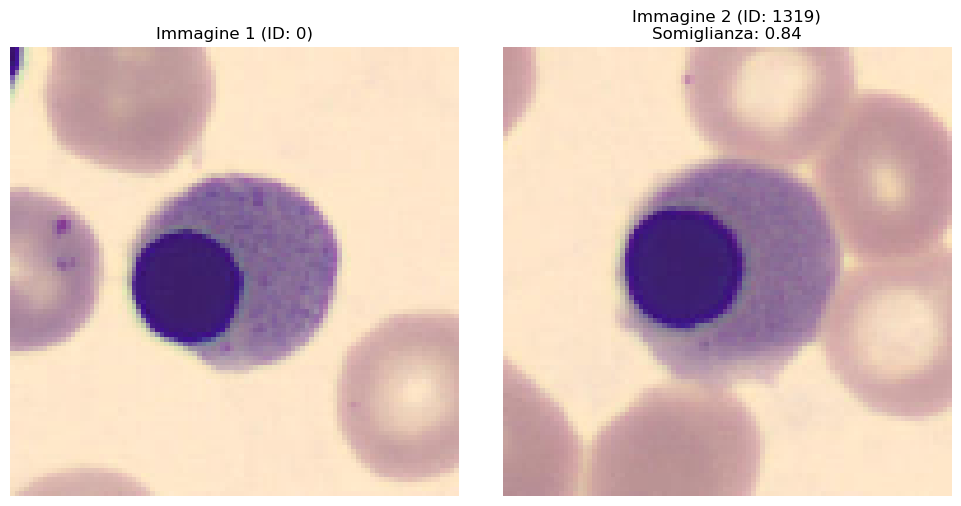

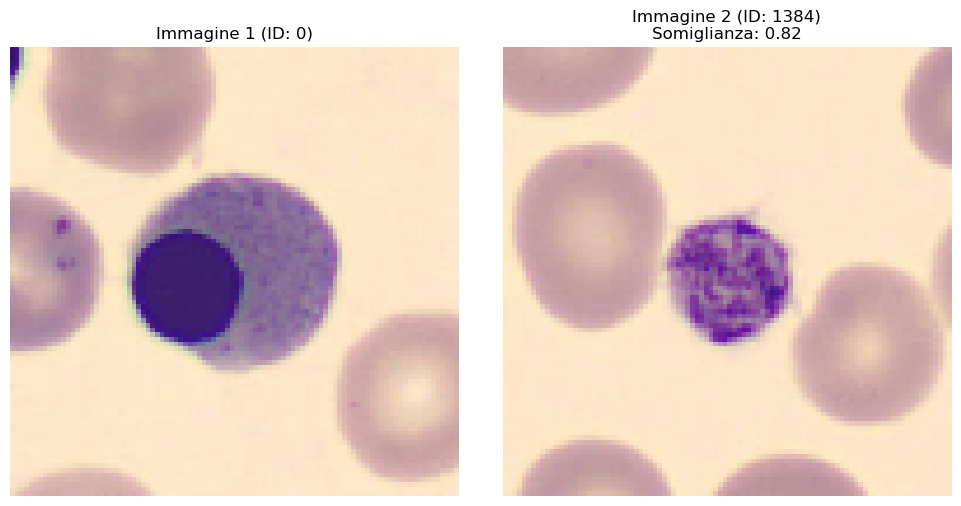

In [8]:
import numpy as np
import tensorflow as tf
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt

# 1. Estrai le feature delle immagini utilizzando un modello pre-addestrato
def extract_features(model, images):
    """
    Estrai le feature utilizzando un modello pre-addestrato.
    """
    images = tf.keras.applications.efficientnet.preprocess_input(images)
    features = model.predict(images, verbose=0)
    return features

# Carica un modello pre-addestrato per estrarre le feature
base_model = tf.keras.applications.EfficientNetB0(
    include_top=False, weights='imagenet', input_shape=(96, 96, 3), pooling='avg'
)

# 2. Estrazione delle feature dal dataset
features = extract_features(base_model, X)  # X è il tuo dataset di immagini (shape: (N, 96, 96, 3))

# 3. Calcolo della somiglianza
similarity_matrix = cosine_similarity(features)  # Matrice di somiglianza (NxN)

# 4. Trova immagini simili
threshold = 0.8  # Soglia di somiglianza
pairs = []

for i in range(len(similarity_matrix)):
    for j in range(i + 1, len(similarity_matrix)):
        if similarity_matrix[i, j] > threshold:
            pairs.append((i, j, similarity_matrix[i, j]))

# 5. Visualizza alcune immagini simili
print(f"Trovate {len(pairs)} coppie di immagini simili con somiglianza > {threshold}")

for idx, (img1_idx, img2_idx, sim) in enumerate(pairs[:5]):  # Mostra le prime 5 coppie
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(X[img1_idx].astype("uint8"))
    axes[0].set_title(f"Immagine 1 (ID: {img1_idx})")
    axes[0].axis('off')
    
    axes[1].imshow(X[img2_idx].astype("uint8"))
    axes[1].set_title(f"Immagine 2 (ID: {img2_idx})\nSomiglianza: {sim:.2f}")
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()


Trovate 40397 coppie di immagini simili con somiglianza > 0.9


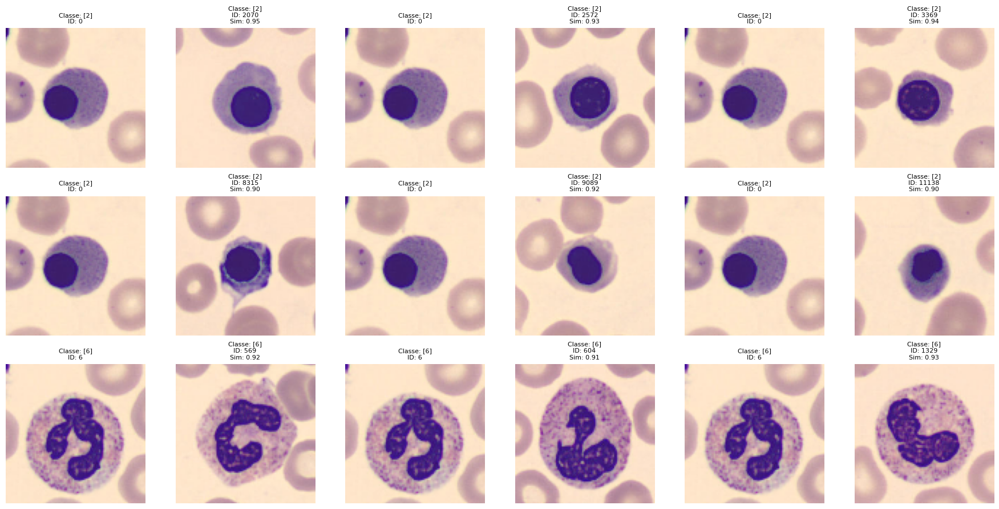

In [10]:
import numpy as np
import tensorflow as tf
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt

# 1. Estrai le feature delle immagini utilizzando un modello pre-addestrato
def extract_features(model, images):
    """
    Estrai le feature utilizzando un modello pre-addestrato.
    """
    images = tf.keras.applications.efficientnet.preprocess_input(images)
    features = model.predict(images, verbose=0)
    return features

# Carica un modello pre-addestrato per estrarre le feature
base_model = tf.keras.applications.EfficientNetB0(
    include_top=False, weights='imagenet', input_shape=(96, 96, 3), pooling='avg'
)

# 2. Estrazione delle feature dal dataset
features = extract_features(base_model, X)  # X è il tuo dataset di immagini (shape: (N, 96, 96, 3))

# 3. Calcolo della somiglianza
similarity_matrix = cosine_similarity(features)  # Matrice di somiglianza (NxN)

# 4. Trova immagini simili
threshold = 0.9  # Soglia di somiglianza
pairs = []

for i in range(len(similarity_matrix)):
    for j in range(i + 1, len(similarity_matrix)):
        if similarity_matrix[i, j] > threshold:
            pairs.append((i, j, similarity_matrix[i, j]))

# 5. Visualizza alcune immagini simili
print(f"Trovate {len(pairs)} coppie di immagini simili con somiglianza > {threshold}")

# Numero di coppie da mostrare
num_pairs_to_show = 9
rows = (num_pairs_to_show + 2) // 3  # 3 coppie per riga
fig, axes = plt.subplots(rows, 6, figsize=(18, rows * 3))  # 6 colonne: 3 coppie per riga

for idx, (img1_idx, img2_idx, sim) in enumerate(pairs[:num_pairs_to_show]):
    row, col_start = divmod(idx * 2, 6)
    
    # Mostra immagine 1
    axes[row, col_start].imshow(X[img1_idx].astype("uint8"))
    axes[row, col_start].set_title(f"Classe: {y[img1_idx]}\nID: {img1_idx}", fontsize=8)
    axes[row, col_start].axis('off')

    # Mostra immagine 2
    axes[row, col_start + 1].imshow(X[img2_idx].astype("uint8"))
    axes[row, col_start + 1].set_title(f"Classe: {y[img2_idx]}\nID: {img2_idx}\nSim: {sim:.2f}", fontsize=8)
    axes[row, col_start + 1].axis('off')

# Rimuovi gli assi vuoti
for ax in axes.flatten():
    if not ax.has_data():
        ax.axis('off')

plt.tight_layout()
plt.show()

Trovate 40397 coppie di immagini simili con somiglianza > 0.9


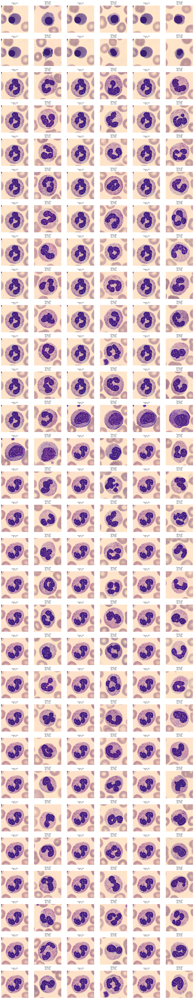

In [12]:
import numpy as np
import tensorflow as tf
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt

# 1. Estrai le feature delle immagini utilizzando un modello pre-addestrato
def extract_features(model, images):
    """
    Estrai le feature utilizzando un modello pre-addestrato.
    """
    images = tf.keras.applications.efficientnet.preprocess_input(images)
    features = model.predict(images, verbose=0)
    return features

# Carica un modello pre-addestrato per estrarre le feature
base_model = tf.keras.applications.EfficientNetB0(
    include_top=False, weights='imagenet', input_shape=(96, 96, 3), pooling='avg'
)

# 2. Estrazione delle feature dal dataset
features = extract_features(base_model, X)  # X è il tuo dataset di immagini (shape: (N, 96, 96, 3))

# 3. Calcolo della somiglianza
similarity_matrix = cosine_similarity(features)  # Matrice di somiglianza (NxN)

# 4. Trova immagini simili
threshold = 0.9  # Soglia di somiglianza
pairs = []

for i in range(len(similarity_matrix)):
    for j in range(i + 1, len(similarity_matrix)):
        if similarity_matrix[i, j] > threshold:
            pairs.append((i, j, similarity_matrix[i, j]))

# 5. Visualizza alcune immagini simili
print(f"Trovate {len(pairs)} coppie di immagini simili con somiglianza > {threshold}")

# Numero di coppie da mostrare
num_pairs_to_show = 90
rows = (num_pairs_to_show + 2) // 3  # 3 coppie per riga
fig, axes = plt.subplots(rows, 6, figsize=(18, rows * 3))  # 6 colonne: 3 coppie per riga

for idx, (img1_idx, img2_idx, sim) in enumerate(pairs[:num_pairs_to_show]):
    row, col_start = divmod(idx * 2, 6)
    
    # Mostra immagine 1
    axes[row, col_start].imshow(X[img1_idx].astype("uint8"))
    axes[row, col_start].set_title(f"Classe: {y[img1_idx]}\nID: {img1_idx}", fontsize=8)
    axes[row, col_start].axis('off')

    # Mostra immagine 2
    axes[row, col_start + 1].imshow(X[img2_idx].astype("uint8"))
    axes[row, col_start + 1].set_title(f"Classe: {y[img2_idx]}\nID: {img2_idx}\nSim: {sim:.2f}", fontsize=8)
    axes[row, col_start + 1].axis('off')

# Rimuovi gli assi vuoti
for ax in axes.flatten():
    if not ax.has_data():
        ax.axis('off')

plt.tight_layout()
plt.show()

Trovate 116 coppie di immagini simili con somiglianza > 0.95


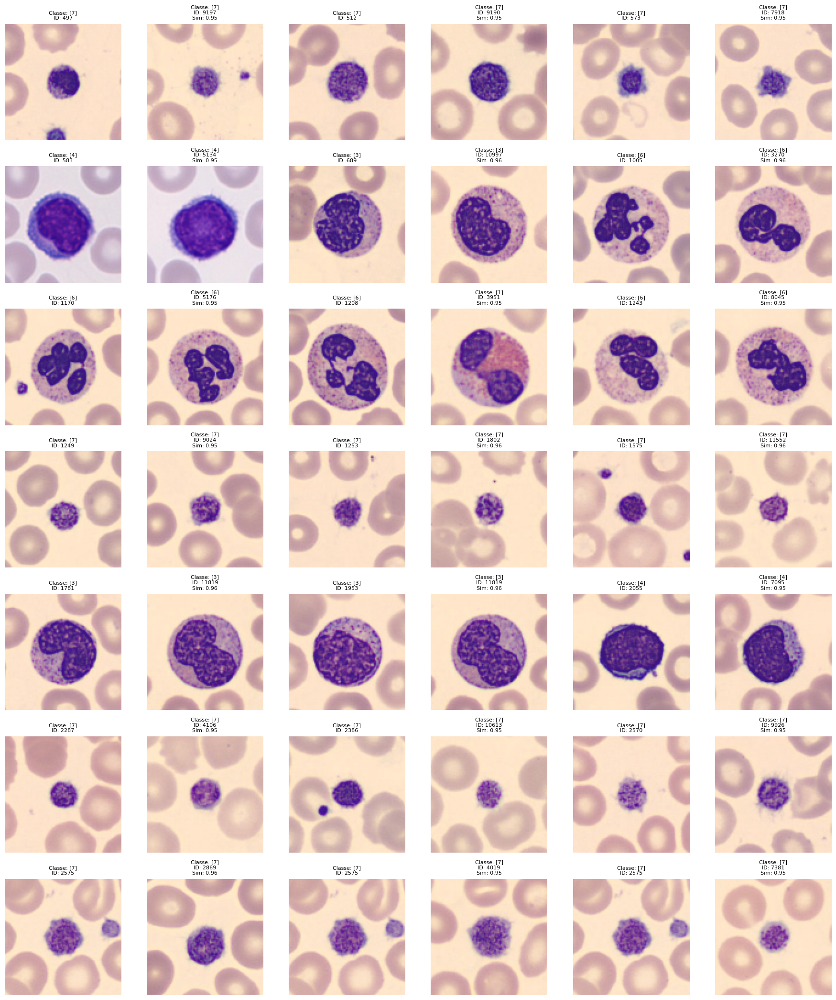

In [11]:
import numpy as np
import tensorflow as tf
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt

# 1. Estrai le feature delle immagini utilizzando un modello pre-addestrato
def extract_features(model, images):
    """
    Estrai le feature utilizzando un modello pre-addestrato.
    """
    images = tf.keras.applications.efficientnet.preprocess_input(images)
    features = model.predict(images, verbose=0)
    return features

# Carica un modello pre-addestrato per estrarre le feature
base_model = tf.keras.applications.EfficientNetB0(
    include_top=False, weights='imagenet', input_shape=(96, 96, 3), pooling='avg'
)

# 2. Estrazione delle feature dal dataset
features = extract_features(base_model, X)  # X è il tuo dataset di immagini (shape: (N, 96, 96, 3))

# 3. Calcolo della somiglianza
similarity_matrix = cosine_similarity(features)  # Matrice di somiglianza (NxN)

# 4. Trova immagini simili
threshold = 0.95  # Soglia di somiglianza
pairs = []

for i in range(len(similarity_matrix)):
    for j in range(i + 1, len(similarity_matrix)):
        if similarity_matrix[i, j] > threshold:
            pairs.append((i, j, similarity_matrix[i, j]))

# 5. Visualizza alcune immagini simili
print(f"Trovate {len(pairs)} coppie di immagini simili con somiglianza > {threshold}")

# Numero di coppie da mostrare
num_pairs_to_show = 21
rows = (num_pairs_to_show + 2) // 3  # 3 coppie per riga
fig, axes = plt.subplots(rows, 6, figsize=(18, rows * 3))  # 6 colonne: 3 coppie per riga

for idx, (img1_idx, img2_idx, sim) in enumerate(pairs[:num_pairs_to_show]):
    row, col_start = divmod(idx * 2, 6)
    
    # Mostra immagine 1
    axes[row, col_start].imshow(X[img1_idx].astype("uint8"))
    axes[row, col_start].set_title(f"Classe: {y[img1_idx]}\nID: {img1_idx}", fontsize=8)
    axes[row, col_start].axis('off')

    # Mostra immagine 2
    axes[row, col_start + 1].imshow(X[img2_idx].astype("uint8"))
    axes[row, col_start + 1].set_title(f"Classe: {y[img2_idx]}\nID: {img2_idx}\nSim: {sim:.2f}", fontsize=8)
    axes[row, col_start + 1].axis('off')

# Rimuovi gli assi vuoti
for ax in axes.flatten():
    if not ax.has_data():
        ax.axis('off')

plt.tight_layout()
plt.show()